# How to distinguish between the presence and absence of cardiac arrhythmia and to classify it in one of the 16 groups.

In [1]:
import pandas as pd
import numpy as np

In [2]:
path = "arrhythmia.data"
df = pd.read_csv(path, header = None)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,270,271,272,273,274,275,276,277,278,279
0,75,0,190,80,91,193,371,174,121,-16,...,0.0,9.0,-0.9,0.0,0.0,0.9,2.9,23.3,49.4,8
1,56,1,165,64,81,174,401,149,39,25,...,0.0,8.5,0.0,0.0,0.0,0.2,2.1,20.4,38.8,6
2,54,0,172,95,138,163,386,185,102,96,...,0.0,9.5,-2.4,0.0,0.0,0.3,3.4,12.3,49.0,10
3,55,0,175,94,100,202,380,179,143,28,...,0.0,12.2,-2.2,0.0,0.0,0.4,2.6,34.6,61.6,1
4,75,0,190,80,88,181,360,177,103,-16,...,0.0,13.1,-3.6,0.0,0.0,-0.1,3.9,25.4,62.8,7


In [3]:
headers = ['1 Age','2 Sex','3 Height','4 Weight','5 QRS duration','6 P-R interval','7 Q-T interval','8 T interval','9 P interval','10 QRS','11 T','12 P','13 QRST','14 J','15 Heart rate','16 DI Q Wave','17 DI R wave','18 DI S wave','19 DI R\'wave','20 DI S\'wave','21 DI Number of intrinsic deflections','22 DI Existence of ragged R wave','23 DI Existence of diphasic derivation of R wave','24 DI Existence of ragged P wave','25 DI Existence of diphasic derivation of P wave','26 DI Existence of ragged T wave','27 DI Existence of diphasic derivation of T wave'   ,'28 DII Q Wave','29 DII R wave','30 DII S wave','31 DII R\'wave','32 DII S\'wave','33 DII Number of intrinsic deflections','34 DII Existence of ragged R wave','35 DII Existence of DIIphasic derivation of R wave','36 DII Existence of ragged P wave','37 DII Existence of diphasic derivation of P wave','38 DII Existence of ragged T wave','39 DII Existence of diphasic derivation of T wave', '40 DIII Q Wave','41 DIII R wave','42 DIII S wave','43 DIII R\'wave','44 DIII S\'wave','45 DIII Number of intrinsic deflections','46 DIII Existence of ragged R wave','47 DIII Existence of DIIIphasic derivation of R wave','48 DIII Existence of ragged P wave','49 DIII Existence of diphasic derivation of P wave','50 DIII Existence of ragged T wave','51 DIII Existence of diphasic derivation of T wave'   ,'52 AVR Q Wave','53 AVR R wave','54 AVR S wave','55 AVR R\'wave','56 AVR S\'wave','57 AVR Number of intrinsic deflections',   '58 AVR Existence of ragged R wave','59 AVR Existence of diphasic derivation of R wave','60 AVR Existence of ragged P wave','61 AVR Existence of diphasic derivation of P wave','62 AVR Existence of ragged T wave','63 AVR Existence of diphasic derivation of T wave' ,'64 AVL Q Wave','65 AVL R wave','66 AVL S wave','67 AVL R\'wave','68 AVL S\'wave','69 AVL Number of intrinsic deflections','70 AVL Existence of ragged R wave','71 AVL Existence of AVLphasic derivation of R wave','72 AVL Existence of ragged P wave','73 AVL Existence of diphasic derivation of P wave','74 AVL Existence of ragged T wave','75 AVL Existence of diphasic derivation of T wave'   ,'76 AVF Q Wave','77 AVF R wave','78 AVF S wave','79 AVF R\'wave','80 AVF S\'wave','81 AVF Number of intrinsic deflections','82 AVF Existence of ragged R wave','83 AVF Existence of AVFphasic derivation of R wave','84 AVF Existence of ragged P wave','85 AVF Existence of diphasic derivation of P wave','86 AVF Existence of ragged T wave','87 AVF Existence of diphasic derivation of T wave'   ,'88 V1 Q Wave','89 V1 R wave','90 V1 S wave','91 V1 R\'wave','92 V1 S\'wave','93 V1 Number of intrinsic deflections','94 V1 Existence of ragged R wave','95 V1 Existence of V1phasic derivation of R wave','96 V1 Existence of ragged P wave','97 V1 Existence of diphasic derivation of P wave','98 V1 Existence of ragged T wave','99 V1 Existence of diphasic derivation of T wave'   ,'100 v2 Q Wave','101 v2 R wave','102 v2 S wave','103 v2 R\'wave','104 v2 S\'wave','105 v2 Number of intrinsic deflections','106 v2 Existence of ragged R wave','107 v2 Existence of diphasic derivation of R wave','108 v2 Existence of ragged P wave','109 v2 Existence of diphasic derivation of P wave','110 v2 Existence of ragged T wave','111 v2 Existence of diphasic derivation of T wave'   ,'112 V3 Q Wave','113 V3 R wave','114 V3 S wave','115 V3 R\'wave','116 V3 S\'wave','117 V3 Number of intrinsic deflections','118 V3 Existence of ragged R wave','119 V3 Existence of V3phasic derivation of R wave','120 V3 Existence of ragged P wave','121 V3 Existence of diphasic derivation of P wave','122 V3 Existence of ragged T wave','123 V3 Existence of diphasic derivation of T wave'  ,'124 V4 Q Wave','125 V4 R wave','126 V4 S wave','127 V4 R\'wave','128 V4 S\'wave','129 V4 Number of intrinsic deflections','130 V4 Existence of ragged R wave','131 V4 Existence of V4phasic derivation of R wave','132 V4 Existence of ragged P wave','133 V4 Existence of diphasic derivation of P wave','134 V4 Existence of ragged T wave','135 V4 Existence of diphasic derivation of T wave'  ,'136 V5 Q Wave','137 V5 R wave','138 V5 S wave','139 V5 R\'wave','140 V5 S\'wave','141 V5 Number of intrinsic deflections','142 V5 Existence of ragged R wave','143 V5 Existence of diphasic derivation of R wave','144 V5 Existence of ragged P wave','145 V5 Existence of diphasic derivation of P wave','146 V5 Existence of ragged T wave','147 V5 Existence of diphasic derivation of T wave'   ,'148 V6 Q Wave','149 V6 R wave', '150 V6 S wave','151 V6 R\' wave','152 V6 S\' wave','153 V6 Number of intinsic deflections','154 V6 Existence of ragged R wave','155 V6 Existence of diphasic derivation of R wave','156 V6 Existence of ragged P wave','157 V6 Existence of diphasic derivation of P wave', '158 V6 Existence of ragged T wave', '159 V6 Existence of diphasic derivation of T wave', '160 DI JJ wave','161 DI Q waves' ,'162 DI R waves' ,'163 DI S waves' ,'164 DI R\' waves' , '165 DI S\' waves' , '166 DI P waves' , '167 DI T waves' , '168 DI QRSA' ,'169 DI QRSTA', '170 DII jj waves' , ' 171 DII Q waves' , '172 DII R waves' , '173 DII S waves' , '174 DII R\' waves' , '175 DII S\' waves' , '176 DII P waves' , '177 DII T waves' , '178 DII QRSA' , '179 DII QRSTA' , '180 DIII jj waves' , '181 DIII Q waves' , '182 DIII R waves' , '183 DIII S waves' ,'184 DIII R\' waves' , '185 DIII S\' waves' , '186 DIII P waves' , '187 DIII T waves' , '188 DIII QRSA' , '189 DIII QRSTA', '190 AVR jj waves' , '191 AVR Q waves' , '192 AVR R waves' , '193 AVR S waves' , '194 AVR R\' waves' , '195 AVR S\' waves' , '196 AVR P waves' , '197 AVR T waves' , '198 AVR QRSA' , '199 AVR QRSTA' , '200 AVL jj waves' , '201 AVL Q waves' , '202 AVL R waves' , '203 AVL S waves' , '204 AVL R\' waves' , '205 AVL S\ waves' , '206 AVL P waves' , '207 AVL T waves' , '208 AVL QRSA' , '209 AVL QRSTA' ,'210 AVF jj waves' , '211 AVF Q waves' , '212 AVF R waves' , '213 AVF S waves' , '214 AVF R\' waves' , '215 AVF S\' waves' , '216 AVF P waves' , '217 AVF T waves' , '218 AVF QRSA' , '219 AVF QRSTA' , '220 V1 jj waves' , '221 V1 Q waves' ,'222 V1 R waves' , '223 V1 S waves' , '224 V1 R\' waves' , '225 V1 S\' waves' , '226 V1 P waves' , '227 V1 T waves' , '228 V1 QRSA' , '229 V1 QRSTA' , '230 V2 jj waves' , '231 V2 Q waves' , '232 V2 R waves' ,  '233 V2 S waves' , '234 V2 R\' waves' , '235 V2 S\' waves' ,'236 V2 P waves' ,'237 V2 T waves' , '238 V2 QRSA' , '239 V2 QRSTA' , '240 V3 jj waves' , '241 V3 Q waves' , '242 V3 R waves' , '243 V3 S waves' , '244 V3 R\' waves' , '245 V3 S\' waves' , '246 V3 P waves' , '247 V3 T waves' , '248 V3 QRSA' , '249 V3 QRSTA' , '250 V4 jj waves' , '251 V4 Q waves' , '252 V4 R waves' , '253 V4 S waves' , '254 V4 R\' waves' , '255 V4 S\' waves' , '256 V4 P waves' , '257 V4 T waves' , '258 V4 QRSA' , '259 V4 QRSTA' ,'260 V5 jj waves' , '261 V5 Q waves' , '262 V5 R waves' , '263 V5 S waves' , '264 V5 R\' waves' , '265 V5 S\' waves' , '266 V5 P waves' , '267 V5 T waves' , '268 V5 QRSA' , '269 V5 QRSTA' , '270 V6 jj waves' , '271 V6 Q waves' , '272 V6 R waves' , '273 V6 S waves' , '274 V6 R\' waves' , '275 V6 S\' waves' , '276 V6 P waves' , '277 V6 T waves' , '278 V6 QRSA' , '279 V6 QRSTA', '280 Diagnosis'];

In [4]:
headers

['1 Age',
 '2 Sex',
 '3 Height',
 '4 Weight',
 '5 QRS duration',
 '6 P-R interval',
 '7 Q-T interval',
 '8 T interval',
 '9 P interval',
 '10 QRS',
 '11 T',
 '12 P',
 '13 QRST',
 '14 J',
 '15 Heart rate',
 '16 DI Q Wave',
 '17 DI R wave',
 '18 DI S wave',
 "19 DI R'wave",
 "20 DI S'wave",
 '21 DI Number of intrinsic deflections',
 '22 DI Existence of ragged R wave',
 '23 DI Existence of diphasic derivation of R wave',
 '24 DI Existence of ragged P wave',
 '25 DI Existence of diphasic derivation of P wave',
 '26 DI Existence of ragged T wave',
 '27 DI Existence of diphasic derivation of T wave',
 '28 DII Q Wave',
 '29 DII R wave',
 '30 DII S wave',
 "31 DII R'wave",
 "32 DII S'wave",
 '33 DII Number of intrinsic deflections',
 '34 DII Existence of ragged R wave',
 '35 DII Existence of DIIphasic derivation of R wave',
 '36 DII Existence of ragged P wave',
 '37 DII Existence of diphasic derivation of P wave',
 '38 DII Existence of ragged T wave',
 '39 DII Existence of diphasic derivation 

In [5]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df.columns = headers
df.head()

,1 Age,2 Sex,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,14 J,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence of diph

In [6]:
df.replace("?", np.nan, inplace = True)
df.isnull().sum()

1 Age                                                     0
2 Sex                                                     0
3 Height                                                  0
4 Weight                                                  0
5 QRS duration                                            0
6 P-R interval                                            0
7 Q-T interval                                            0
8 T interval                                              0
9 P interval                                              0
10 QRS                                                    0
11 T                                                      8
12 P                                                     22
13 QRST                                                   1
14 J                                                    376
15 Heart rate                                             1
16 DI Q Wave                                              0
17 DI R wave                            

### Droping column no 14 J as we have 376 missing values out of 452
### Replacing missing value of  columns T, P, QRST and Heart rate with mean value

In [7]:
df.head()

,1 Age,2 Sex,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,14 J,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence of diph

In [8]:
df.dtypes

1 Age                                                     int64
2 Sex                                                     int64
3 Height                                                  int64
4 Weight                                                  int64
5 QRS duration                                            int64
6 P-R interval                                            int64
7 Q-T interval                                            int64
8 T interval                                              int64
9 P interval                                              int64
10 QRS                                                    int64
11 T                                                     object
12 P                                                     object
13 QRST                                                  object
14 J                                                     object
15 Heart rate                                            object
16 DI Q Wave                            

In [9]:
df = df.drop(['14 J'], axis = 1)
df.head()

,1 Age,2 Sex,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence of diphasic 

In [10]:
df["15 Heart rate"] = pd.to_numeric(df["15 Heart rate"])
df["11 T"] = pd.to_numeric(df["11 T"])
df["12 P"] = pd.to_numeric(df["12 P"])
df["13 QRST"] = pd.to_numeric(df["13 QRST"])
df.dtypes

1 Age                                                     int64
2 Sex                                                     int64
3 Height                                                  int64
4 Weight                                                  int64
5 QRS duration                                            int64
6 P-R interval                                            int64
7 Q-T interval                                            int64
8 T interval                                              int64
9 P interval                                              int64
10 QRS                                                    int64
11 T                                                    float64
12 P                                                    float64
13 QRST                                                 float64
15 Heart rate                                           float64
16 DI Q Wave                                              int64
17 DI R wave                            

In [11]:
mean_HR = df['15 Heart rate'].mean()
mean_T = df['11 T'].mean() 
mean_P = df['12 P'].mean()
mean_QRST = df['13 QRST'].mean()
mean_HR
mean_T
mean_P
mean_QRST
print("mean_HR ", mean_HR, " mean_T ", mean_T, " mean_P ",mean_P, " mean_QRST ", mean_QRST )

mean_HR  74.46341463414635  mean_T  36.1509009009009  mean_P  48.913953488372094  mean_QRST  36.71618625277162


In [12]:
df["15 Heart rate"].replace(np.nan, mean_HR, inplace=True)
df["11 T"].replace(np.nan, mean_T, inplace=True)
df["12 P"].replace(np.nan, mean_P, inplace=True)
df["13 QRST"].replace(np.nan, mean_QRST, inplace=True)
df.head()

,1 Age,2 Sex,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence of diphasic 

In [13]:
df.isnull().sum()

1 Age                                                   0
2 Sex                                                   0
3 Height                                                0
4 Weight                                                0
5 QRS duration                                          0
6 P-R interval                                          0
7 Q-T interval                                          0
8 T interval                                            0
9 P interval                                            0
10 QRS                                                  0
11 T                                                    0
12 P                                                    0
13 QRST                                                 0
15 Heart rate                                           0
16 DI Q Wave                                            0
17 DI R wave                                            0
18 DI S wave                                            0
19 DI R'wave  

In [14]:
df.describe()

,1 Age,2 Sex,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence of diphasic 

In [15]:
df_test = df

df_test.head()

,1 Age,2 Sex,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence of diphasic 

In [16]:
male_female = pd.get_dummies(df_test["2 Sex"])
male_female

,0,1
0,1,0
1,0,1
2,1,0
3,1,0
4,1,0
5,1,0
6,0,1
7,0,1
8,1,0
9,0,1


In [17]:
male_female.rename(columns = { 0 :'Male', 1 : 'Female'},  inplace = True)
male_female.head()

,Male,Female
0,1,0
1,0,1
2,1,0
3,1,0
4,1,0


In [18]:
df_test.insert(1, 'Male', male_female['Male'])
df_test.insert(2, 'Female', male_female['Female'])
df_test.head()

,1 Age,Male,Female,2 Sex,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence 

In [19]:
#df_test.drop('2 Sex', axis = 1, inplace = True)
df_test = df_test.drop(['2 Sex'], axis = 1)
df_test

,1 Age,Male,Female,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence of dip

In [20]:
###Replacing all values which are not 1, we should replace by 2

df_test['280 Diagnosis'].where(df_test['280 Diagnosis'] <= 1, 2, inplace = True)
#df['A'].where(df['A'] <= 9, 11, inplace=True)
df_test.head()

,1 Age,Male,Female,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence of dip

Text(0, 0.5, '15 Heart rate')

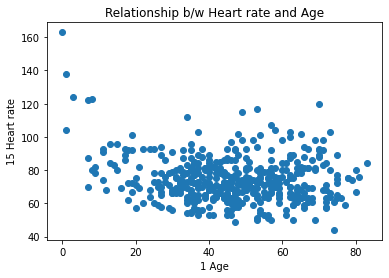

In [21]:
import matplotlib.pyplot as plt
plt.scatter(df_test["1 Age"], df_test["15 Heart rate"])
plt.title("Relationship b/w Heart rate and Age")
plt.xlabel("1 Age")
plt.ylabel("15 Heart rate")

Text(0, 0.5, '280 Diagnosis')

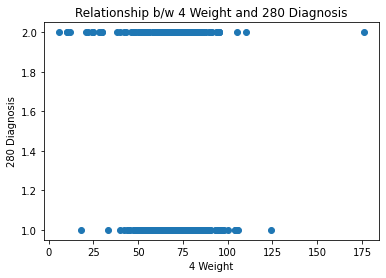

In [22]:
import matplotlib.pyplot as plt
plt.scatter(df_test["4 Weight"], df_test["280 Diagnosis"])
plt.title("Relationship b/w 4 Weight and 280 Diagnosis")
plt.xlabel("4 Weight")
plt.ylabel("280 Diagnosis")

In [23]:
# Statistical Properties
df_test.describe()

,1 Age,Male,Female,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence of dip

In [24]:
# Applying data normalisation techniques on columns Height and weight
# Applying normalization Min-Max on Height column
df_test['3 Height']= (df_test['3 Height']-df_test['3 Height'].min())/(df_test['3 Height'].max() - df_test['3 Height'].min())

df_test['3 Height'].head()

0    0.125926
1    0.088889
2    0.099259
3    0.103704
4    0.125926
Name: 3 Height, dtype: float64

In [25]:
# Applying normalization Z-score on 5 QRS duration column
df_test['5 QRS duration'] = (df_test['5 QRS duration'] - df_test['5 QRS duration'].mean())/df_test['5 QRS duration'].std()
df_test['5 QRS duration'].head()

0    0.135355
1   -0.515501
2    3.194376
3    0.721125
4   -0.059902
Name: 5 QRS duration, dtype: float64

In [26]:
df_test.describe()
#df_test['4 Weight'].dtype

,1 Age,Male,Female,3 Height,4 Weight,5 QRS duration,6 P-R interval,7 Q-T interval,8 T interval,9 P interval,10 QRS,11 T,12 P,13 QRST,15 Heart rate,16 DI Q Wave,17 DI R wave,18 DI S wave,19 DI R'wave,20 DI S'wave,21 DI Number of intrinsic deflections,22 DI Existence of ragged R wave,23 DI Existence of diphasic derivation of R wave,24 DI Existence of ragged P wave,25 DI Existence of diphasic derivation of P wave,26 DI Existence of ragged T wave,27 DI Existence of diphasic derivation of T wave,28 DII Q Wave,29 DII R wave,30 DII S wave,31 DII R'wave,32 DII S'wave,33 DII Number of intrinsic deflections,34 DII Existence of ragged R wave,35 DII Existence of DIIphasic derivation of R wave,36 DII Existence of ragged P wave,37 DII Existence of diphasic derivation of P wave,38 DII Existence of ragged T wave,39 DII Existence of diphasic derivation of T wave,40 DIII Q Wave,41 DIII R wave,42 DIII S wave,43 DIII R'wave,44 DIII S'wave,45 DIII Number of intrinsic deflections,46 DIII Existence of ragged R wave,47 DIII Existence of DIIIphasic derivation of R wave,48 DIII Existence of ragged P wave,49 DIII Existence of diphasic derivation of P wave,50 DIII Existence of ragged T wave,51 DIII Existence of diphasic derivation of T wave,52 AVR Q Wave,53 AVR R wave,54 AVR S wave,55 AVR R'wave,56 AVR S'wave,57 AVR Number of intrinsic deflections,58 AVR Existence of ragged R wave,59 AVR Existence of diphasic derivation of R wave,60 AVR Existence of ragged P wave,61 AVR Existence of diphasic derivation of P wave,62 AVR Existence of ragged T wave,63 AVR Existence of diphasic derivation of T wave,64 AVL Q Wave,65 AVL R wave,66 AVL S wave,67 AVL R'wave,68 AVL S'wave,69 AVL Number of intrinsic deflections,70 AVL Existence of ragged R wave,71 AVL Existence of AVLphasic derivation of R wave,72 AVL Existence of ragged P wave,73 AVL Existence of diphasic derivation of P wave,74 AVL Existence of ragged T wave,75 AVL Existence of diphasic derivation of T wave,76 AVF Q Wave,77 AVF R wave,78 AVF S wave,79 AVF R'wave,80 AVF S'wave,81 AVF Number of intrinsic deflections,82 AVF Existence of ragged R wave,83 AVF Existence of AVFphasic derivation of R wave,84 AVF Existence of ragged P wave,85 AVF Existence of diphasic derivation of P wave,86 AVF Existence of ragged T wave,87 AVF Existence of diphasic derivation of T wave,88 V1 Q Wave,89 V1 R wave,90 V1 S wave,91 V1 R'wave,92 V1 S'wave,93 V1 Number of intrinsic deflections,94 V1 Existence of ragged R wave,95 V1 Existence of V1phasic derivation of R wave,96 V1 Existence of ragged P wave,97 V1 Existence of diphasic derivation of P wave,98 V1 Existence of ragged T wave,99 V1 Existence of diphasic derivation of T wave,100 v2 Q Wave,101 v2 R wave,102 v2 S wave,103 v2 R'wave,104 v2 S'wave,105 v2 Number of intrinsic deflections,106 v2 Existence of ragged R wave,107 v2 Existence of diphasic derivation of R wave,108 v2 Existence of ragged P wave,109 v2 Existence of diphasic derivation of P wave,110 v2 Existence of ragged T wave,111 v2 Existence of diphasic derivation of T wave,112 V3 Q Wave,113 V3 R wave,114 V3 S wave,115 V3 R'wave,116 V3 S'wave,117 V3 Number of intrinsic deflections,118 V3 Existence of ragged R wave,119 V3 Existence of V3phasic derivation of R wave,120 V3 Existence of ragged P wave,121 V3 Existence of diphasic derivation of P wave,122 V3 Existence of ragged T wave,123 V3 Existence of diphasic derivation of T wave,124 V4 Q Wave,125 V4 R wave,126 V4 S wave,127 V4 R'wave,128 V4 S'wave,129 V4 Number of intrinsic deflections,130 V4 Existence of ragged R wave,131 V4 Existence of V4phasic derivation of R wave,132 V4 Existence of ragged P wave,133 V4 Existence of diphasic derivation of P wave,134 V4 Existence of ragged T wave,135 V4 Existence of diphasic derivation of T wave,136 V5 Q Wave,137 V5 R wave,138 V5 S wave,139 V5 R'wave,140 V5 S'wave,141 V5 Number of intrinsic deflections,142 V5 Existence of ragged R wave,143 V5 Existence of diphasic derivation of R wave,144 V5 Existence of ragged P wave,145 V5 Existence of dip

<AxesSubplot:xlabel='280 Diagnosis', ylabel='4 Weight'>

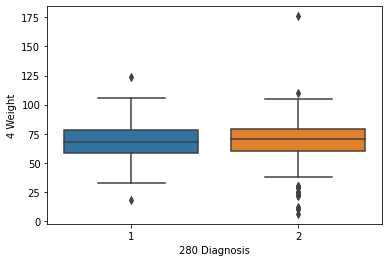

In [51]:
# Draw a boxplot for column 4 (Weight)

import seaborn as sns
sns.boxplot(x="280 Diagnosis", y = "4 Weight", data = df_test)

Text(0, 0.5, '280 Diagnosis')

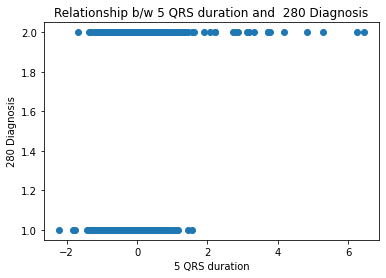

In [28]:
import matplotlib.pyplot as plt
plt.scatter(df_test["5 QRS duration"], df_test["280 Diagnosis"])
plt.title("Relationship b/w 5 QRS duration and  280 Diagnosis")
plt.xlabel("5 QRS duration")
plt.ylabel("280 Diagnosis")

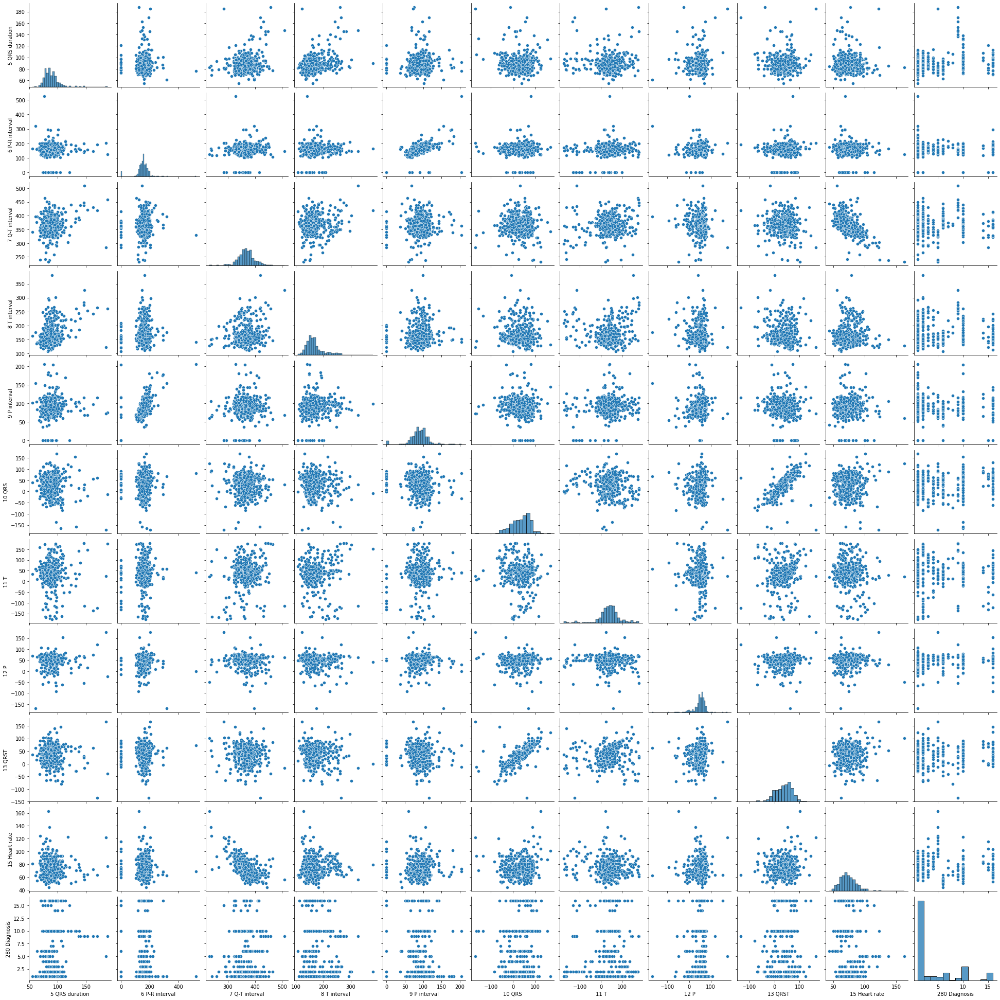

In [29]:
sns.pairplot(df[['5 QRS duration','6 P-R interval','7 Q-T interval','8 T interval','9 P interval','10 QRS','11 T','12 P','13 QRST','15 Heart rate', '280 Diagnosis']])

Text(0, 0.5, '280 Diagnosis')

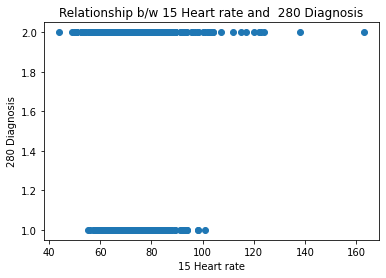

In [30]:
import matplotlib.pyplot as plt
plt.scatter(df_test["15 Heart rate"], df_test["280 Diagnosis"])
plt.title("Relationship b/w 15 Heart rate and  280 Diagnosis")
plt.xlabel("15 Heart rate")
plt.ylabel("280 Diagnosis")



In [31]:
#!pip install scikit-learn
from sklearn.model_selection import train_test_split

In [32]:
# X represetns features, Y target variable
X = df_test[["5 QRS duration", "6 P-R interval", "7 Q-T interval", "8 T interval", "9 P interval", "10 QRS", "12 P", "13 QRST", "15 Heart rate", "279 V6 QRSTA"]]
Y = df_test["280 Diagnosis"]

In [33]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

In [34]:
x_train.shape, x_test.shape

((316, 10), (136, 10))

In [35]:
# Import Logistic Model from scikit-learn
from sklearn.linear_model import LogisticRegression
# Create a Logistic Regression Object
logistic_model = LogisticRegression(max_iter = 10000)


In [36]:
# Model fit
logistic_model.fit(x_train,y_train)

LogisticRegression(max_iter=10000)

In [37]:
logistic_model.intercept_ , logistic_model.coef_

(array([-4.03182483]),
 array([[ 1.19539078e+00,  1.13391252e-02,  6.42177855e-03,
          8.15095994e-03, -3.64994994e-02, -2.35552604e-03,
         -2.96876148e-04,  7.77049252e-03,  3.30604995e-02,
         -3.70570232e-02]]))

In [38]:
y_test

299    1
39     2
336    2
332    2
153    2
196    1
290    1
101    1
398    2
30     2
72     1
165    1
140    1
370    2
355    1
55     2
401    2
227    2
390    1
82     2
77     2
132    1
248    2
117    1
204    2
218    2
79     1
442    1
9      2
340    2
379    2
245    2
417    2
113    1
446    1
76     2
278    2
317    1
124    1
78     1
284    2
90     1
302    2
73     1
420    2
75     2
70     2
180    1
409    2
428    1
275    2
33     1
244    1
312    2
373    1
400    2
11     1
396    1
15     1
439    1
353    2
0      2
19     1
289    1
298    2
56     1
280    1
338    1
297    2
423    1
433    2
383    1
25     2
426    1
304    2
368    2
42     1
209    2
443    2
116    2
234    1
287    1
291    2
22     1
46     2
437    1
447    1
137    2
93     2
57     1
192    2
24     1
17     1
66     2
301    1
356    2
31     1
84     2
377    1
126    1
185    2
154    2
94     2
408    1
168    2
272    2
281    1
394    1
104    2
310    1
5      2
4

In [39]:
predictions = logistic_model.predict(x_test)
predictions

array([1, 1, 1, 2, 1, 2, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 2, 2, 1,
       1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 2, 1,
       2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       1, 1, 2, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2,
       1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1,
       2, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2,
       1, 1, 1, 1], dtype=int64)

In [40]:
# Use score method to get accuracy of model
score = logistic_model.score(x_test, y_test)
print(score)

0.6544117647058824


In [41]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(logistic_model, X, Y, cv=10)
scores

array([0.60869565, 0.7173913 , 0.62222222, 0.64444444, 0.71111111,
       0.73333333, 0.75555556, 0.62222222, 0.73333333, 0.64444444])

In [42]:
np.mean(scores)

0.6792753623188406

In [43]:
predictions = logistic_model.predict(x_test)
predictions

array([1, 1, 1, 2, 1, 2, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 2, 2, 1,
       1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 2, 1,
       2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       1, 1, 2, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2,
       1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1,
       2, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2,
       1, 1, 1, 1], dtype=int64)

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import  classification_report

In [45]:
cm = metrics.confusion_matrix(y_test,  predictions)
print(cm)

[[58 11]
 [36 31]]


Text(0.5, -3.0, 'Predicted label')

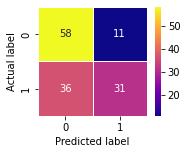

In [46]:
plt.figure(figsize=(3,2))
sns.heatmap(cm, annot=True, linewidths=1, square = True, cmap = 'plasma')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [47]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           1       0.62      0.84      0.71        69
           2       0.74      0.46      0.57        67

    accuracy                           0.65       136
   macro avg       0.68      0.65      0.64       136
weighted avg       0.68      0.65      0.64       136

